In [1]:
# Importing necessary libraries
import numpy as np       # For numerical operations
import pandas as pd      # For data manipulation and analysis
import matplotlib.pyplot as plt  # For creating static, animated, and interactive visualizations
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import gaussian_kde
import seaborn as sns    # For statistical data visualization

# Ignoring warnings to keep the output clean
import warnings
warnings.filterwarnings('ignore')  # Suppress warnings (e.g., deprecated features or small issues)

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
import pickle



In [2]:
df=pd.read_csv("/home/varun/Desktop/Mental Health Project/data/student_depression_dataset.csv")
print("Dataset Preview:")
df

Dataset Preview:


,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,2,Male,33.0,Visakhapatnam,Student,5.0,0.0,8.97,2.0,0.0,'5-6 hours',Healthy,B.Pharm,Yes,3.0,1.0,No,1
1,8,Female,24.0,Bangalore,Student,2.0,0.0,5.90,5.0,0.0,'5-6 hours',Moderate,BSc,No,3.0,2.0,Yes,0
2,26,Male,31.0,Srinagar,Student,3.0,0.0,7.03,5.0,0.0,'Less than 5 hours',Healthy,BA,No,9.0,1.0,Yes,0
3,30,Female,28.0,Varanasi,Student,3.0,0.0,5.59,2.0,0.0,'7-8 hours',Moderate,BCA,Yes,4.0,5.0,Yes,1
4,32,Female,25.0,Jaipur,Student,4.0,0.0,8.13,3.0,0.0,'5-6 hours',Moderate,M.Tech,Yes,1.0,1.0,No,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27896,140685,Female,27.0,Surat,Student,5.0,0.0,5.75,5.0,0.0,'5-6 hours',Unhealthy,'Class 12',Yes,7.0,1.0,Yes,0
27897,140686,Male,27.0,Ludhiana,Student,2.0,0.0,9.40,3.0,0.0,'Less than 5 hours',Healthy,MSc,No,0.0,3.0,Yes,0
27898,140689,Male,31.0,Faridabad,Student,3.0,0.0,6.61,4.0,0.0,'5-6 hours',Unhealthy,MD,No,12.0,2.0,No,0
27899,140690,Female,18.0,Ludhiana,Student,5.0,0.0,6.88,2.0,0.0,'Less than 5 hours',Healthy,'Class 12',Yes,10.0,5.0,No,1


In [3]:
print("\nColumn Names:")
df.columns


Column Names:


Index(['id', 'Gender', 'Age', 'City', 'Profession', 'Academic Pressure',
       'Work Pressure', 'CGPA', 'Study Satisfaction', 'Job Satisfaction',
       'Sleep Duration', 'Dietary Habits', 'Degree',
       'Have you ever had suicidal thoughts ?', 'Work/Study Hours',
       'Financial Stress', 'Family History of Mental Illness', 'Depression'],
      dtype='object')

In [4]:
df["Degree"].value_counts()

Degree
'Class 12'    6080
B.Ed          1867
B.Com         1506
B.Arch        1478
BCA           1433
MSc           1190
B.Tech        1152
MCA           1044
M.Tech        1022
BHM            925
BSc            888
M.Ed           821
B.Pharm        810
M.Com          734
BBA            696
MBBS           696
LLB            671
BE             613
BA             600
M.Pharm        582
MD             572
MBA            562
MA             544
PhD            522
LLM            482
MHM            191
ME             185
Others          35
Name: count, dtype: int64

In [5]:
df["Sleep Duration"].value_counts()

Sleep Duration
'Less than 5 hours'    8310
'7-8 hours'            7346
'5-6 hours'            6183
'More than 8 hours'    6044
Others                   18
Name: count, dtype: int64

In [6]:
df["Dietary Habits"].value_counts()

Dietary Habits
Unhealthy    10317
Moderate      9921
Healthy       7651
Others          12
Name: count, dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27901 entries, 0 to 27900
Data columns (total 18 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     27901 non-null  int64  
 1   Gender                                 27901 non-null  object 
 2   Age                                    27901 non-null  float64
 3   City                                   27901 non-null  object 
 4   Profession                             27901 non-null  object 
 5   Academic Pressure                      27901 non-null  float64
 6   Work Pressure                          27901 non-null  float64
 7   CGPA                                   27901 non-null  float64
 8   Study Satisfaction                     27901 non-null  float64
 9   Job Satisfaction                       27901 non-null  float64
 10  Sleep Duration                         27901 non-null  object 
 11  Di

In [8]:
df.describe()

,id,Age,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Work/Study Hours,Depression
count,27901.000000,27901.000000,27901.000000,27901.000000,27901.000000,27901.000000,27901.000000,27901.000000,27901.000000
mean,70442.149421,25.822300,3.141214,0.000430,7.656104,2.943837,0.000681,7.156984,0.585499
std,40641.175216,4.905687,1.381465,0.043992,1.470707,1.361148,0.044394,3.707642,0.492645
min,2.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,35039.000000,21.000000,2.000000,0.000000,6.290000,2.000000,0.000000,4.000000,0.000000
50%,70684.000000,25.000000,3.000000,0.000000,7.770000,3.000000,0.000000,8.000000,1.000000
75%,105818.000000,30.000000,4.000000,0.000000,8.920000,4.000000,0.000000,10.000000,1.000000
max,140699.000000,59.000000,5.000000,5.000000,10.000000,5.000000,4.000000,12.000000,1.000000


In [9]:
df.isnull().sum()

id                                       0
Gender                                   0
Age                                      0
City                                     0
Profession                               0
Academic Pressure                        0
Work Pressure                            0
CGPA                                     0
Study Satisfaction                       0
Job Satisfaction                         0
Sleep Duration                           0
Dietary Habits                           0
Degree                                   0
Have you ever had suicidal thoughts ?    0
Work/Study Hours                         0
Financial Stress                         0
Family History of Mental Illness         0
Depression                               0
dtype: int64

good we have no null values

In [10]:
# List of columns to analyze
columns_to_analyze = ['Profession', 'Degree', 'Sleep Duration', 'Age', 'Gender', 'CGPA', 'Work/Study Hours', 'Academic Pressure','Financial Stress']


In [11]:
# Define a dark theme for the layout
dark_theme_layout = {
    'plot_bgcolor': '#2a2a2a',  # Dark background
    'paper_bgcolor': '#2a2a2a',  # Paper background
    'font': {'color': '#fff'},    # White font color
    'xaxis': {'showgrid': False}, # Hide gridlines
    'yaxis': {'showgrid': False}, # Hide gridlines
    'title': {'font': {'color': '#fff'}},  # White title
}

In [13]:
# Determine the number of rows and columns for subplots
rows = 3  # Number of rows of plots
cols = 3  # Number of columns of plots 

# Create a subplot grid (3x3 for 9 plots)
fig = make_subplots(rows=rows, cols=cols, 
                    subplot_titles=columns_to_analyze,
                    vertical_spacing=0.1, horizontal_spacing=0.1)

# Loop through each column and add a subplot
for i, col in enumerate(columns_to_analyze):
    row = i // cols + 1  
    col_num = i % cols + 1  

    # Create bar plot for each column's value counts
    trace = go.Bar(
        x=df[col].value_counts().index,
        y=df[col].value_counts().values,
        name=f'{col} Distribution',
        marker=dict(color='skyblue')
    )

    # Add the trace to the subplot
    fig.add_trace(trace, row=row, col=col_num)

# Update layout for dark theme
fig.update_layout(
    dark_theme_layout,
    title='Distribution of Columns',
    showlegend=False,
    height=900,
    width=1200,
)

# Show the figure interactively
fig.show()


In [14]:
def plot_categorical_distribution(df):
    for column in df.select_dtypes(include='object'):  # Loop through all categorical columns
        # Get the value counts for the current column
        value_counts = df[column].value_counts().reset_index()
        value_counts.columns = [column, 'Count']  # Rename columns for clarity
        
        # Create a bar plot for the categorical column using Plotly Express
        fig = px.bar(
            value_counts, 
            x=column,  # Categories on x-axis
            y='Count',  # Count of each category on y-axis
            labels={column: f'Distribution of {column}', 'y': 'Count'},  # Labels
            title=f'Distribution of {column}',  # Title of the plot
            color=column,  # Coloring by the categories
            template='plotly_dark',  # Apply dark template
        )

        # Update the layout with dark theme
        fig.update_layout(dark_theme_layout)

        # Show the plot interactively
        fig.show()

In [15]:
# Call the function to plot the categorical distributions
plot_categorical_distribution(df)

In [16]:
# Function to plot numerical distributions (histogram + KDE) using Plotly
def plot_numerical_distribution_with_kde(df):
    for column in df.select_dtypes(include=['int64', 'float64']):  # Loop through all numerical columns
        # Create the histogram for the numerical column
        fig = go.Figure()

        # Add histogram trace
        fig.add_trace(go.Histogram(
            x=df[column],
            nbinsx=30,  # Number of bins (adjust as needed)
            name=f'Histogram of {column}',
            marker=dict(color='skyblue', opacity=0.7),
            xaxis='x1',  # Set x-axis for histogram
            yaxis='y1',  # Set y-axis for histogram
        ))

        # Calculate KDE using scipy's gaussian_kde
        kde = gaussian_kde(df[column].dropna(), bw_method='silverman')  # Using Silverman method to estimate bandwidth
        x_vals = np.linspace(df[column].min(), df[column].max(), 1000)  # Generate x values for the KDE curve
        kde_vals = kde(x_vals)  # Get corresponding y values (density)

        # Add the KDE curve to the plot
        fig.add_trace(go.Scatter(
            x=x_vals,
            y=kde_vals,
            mode='lines',
            name=f'KDE of {column}',
            line=dict(color='red', width=2),
            xaxis='x1',  # Set x-axis for KDE
            yaxis='y1',  # Set y-axis for KDE
        ))

        # Update the layout with dark theme and additional customization
        fig.update_layout(
            dark_theme_layout,
            title=f'Distribution of {column}',
            xaxis_title=column,
            yaxis_title='Density',
            showlegend=True,
            height=400,
            width=600,
        )

        # Show the plot interactively
        fig.show()



In [17]:
# Call the function to plot the numerical distributions (histogram + KDE)
plot_numerical_distribution_with_kde(df)

In [27]:
# Function to create bar plots with contrast-friendly colors
def plot_depression_by_category(df, category_column, title):
    fig = px.bar(
        df, 
        x=category_column, 
        color='Depression', 
        title=title,
        labels={category_column: category_column, 'Depression': 'Depression Status'},
        category_orders={'Depression': ['No', 'Yes']},  # Adjust according to the depression variable
        barmode='stack',  # Stacked bars for better visibility of each category
        color_discrete_sequence=["#FF6347", "#32CD32"],  # Brighter contrasting colors (red for Yes, green for No)
    )
    
    # Update layout for better readability and contrast
    fig.update_layout(
        template='plotly_dark',  # Dark theme
        plot_bgcolor='#2a2a2a',  # Darker background for the plot
        paper_bgcolor='#2a2a2a',  # Darker background for the paper
        font=dict(color='#ffffff'),  # White font color for text
        xaxis_title=category_column,
        yaxis_title="Count",
        barmode='stack',
        xaxis_tickangle=-45  # Rotate x-axis labels for better readability
    )

    # Show the figure
    fig.show()

In [28]:
# Example for Gender vs Depression
plot_depression_by_category(df, 'Gender', "Depression Rate by Gender")


In [29]:

# Example for Sleep Duration vs Depression
plot_depression_by_category(df, 'Sleep Duration', "Depression Rate by Sleep Duration")

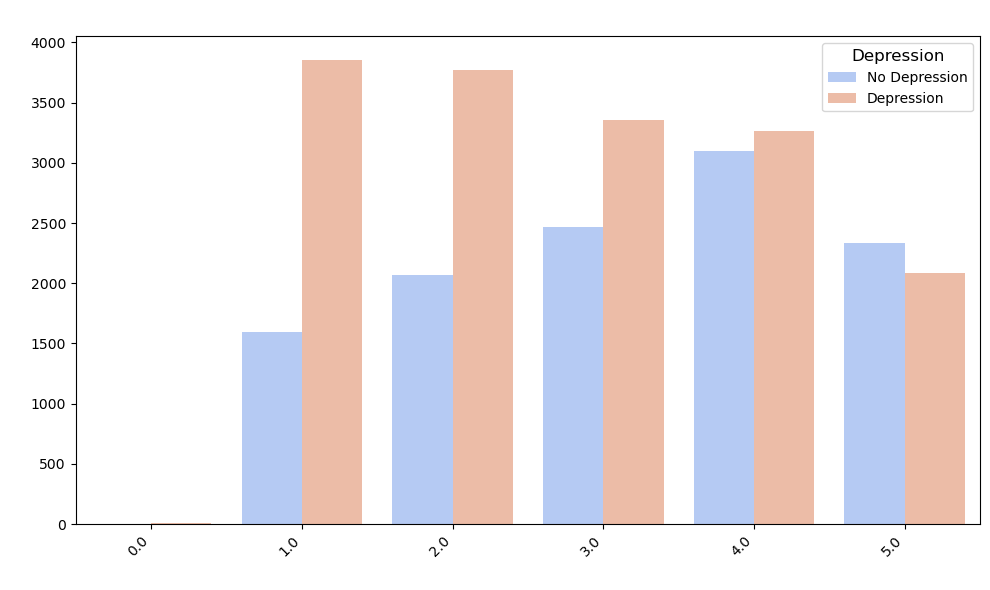

In [30]:
def plot_countplot(df, x_column, hue_column, title):
    
    # Create a figure and axis
    plt.figure(figsize=(10, 6))
    
    # Create the countplot with custom color palette
    sns.countplot(
        data=df,
        x=x_column,  # X-axis variable (categorical)
        hue=hue_column,  # Group by hue (e.g., Depression status)
        palette='coolwarm'  # Custom color palette for better contrast
    )
    
    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    
    # Set the title and labels with larger font sizes
    plt.title(title, fontsize=16, fontweight='bold', color='#ffffff')
    plt.xlabel(x_column, fontsize=12, color='#ffffff')
    plt.ylabel('Count', fontsize=12, color='#ffffff')
    
    # Adjust the legend to improve positioning and visibility
    plt.legend(title=hue_column, loc='upper right', fontsize=10, title_fontsize=12, labels=['No Depression', 'Depression'])

    # Adjust the layout to make sure everything fits well
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Usage example for Study Satisfaction vs Depression
plot_countplot(df, x_column='Study Satisfaction', hue_column='Depression', title='Study Satisfaction vs Depression')

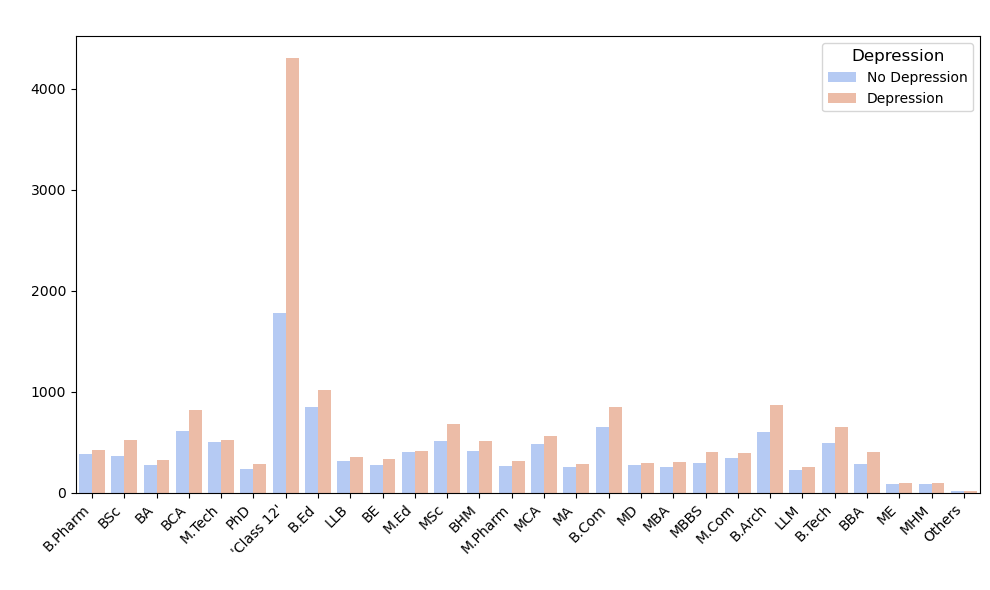

In [31]:
#For degree
plot_countplot(df, x_column='Degree', hue_column='Depression', title='Profession vs Depression')


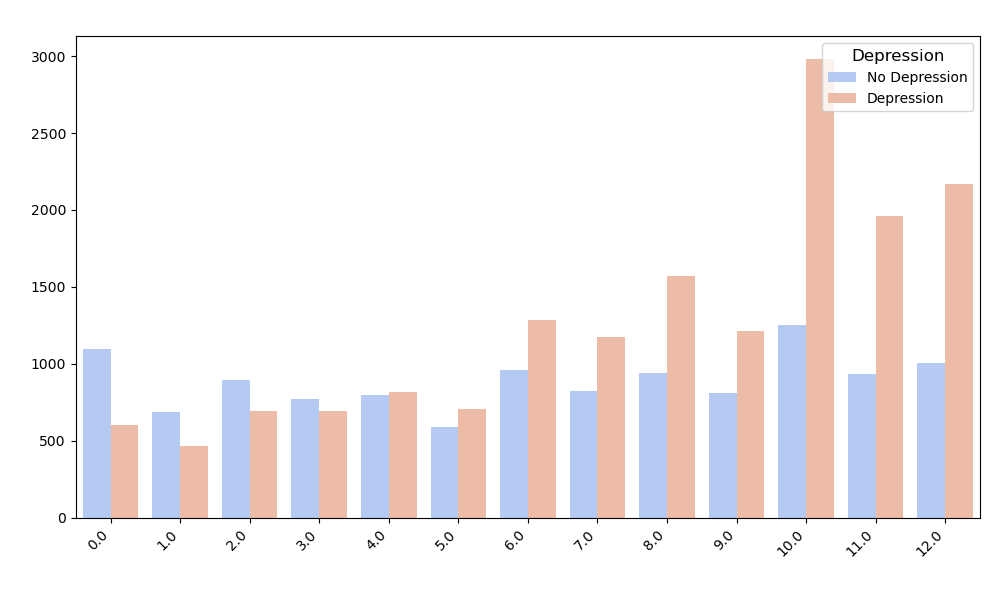

In [32]:
#For Work/study hours
plot_countplot(df, x_column='Work/Study Hours', hue_column='Depression', title='Work/Study Hours vs Depression')


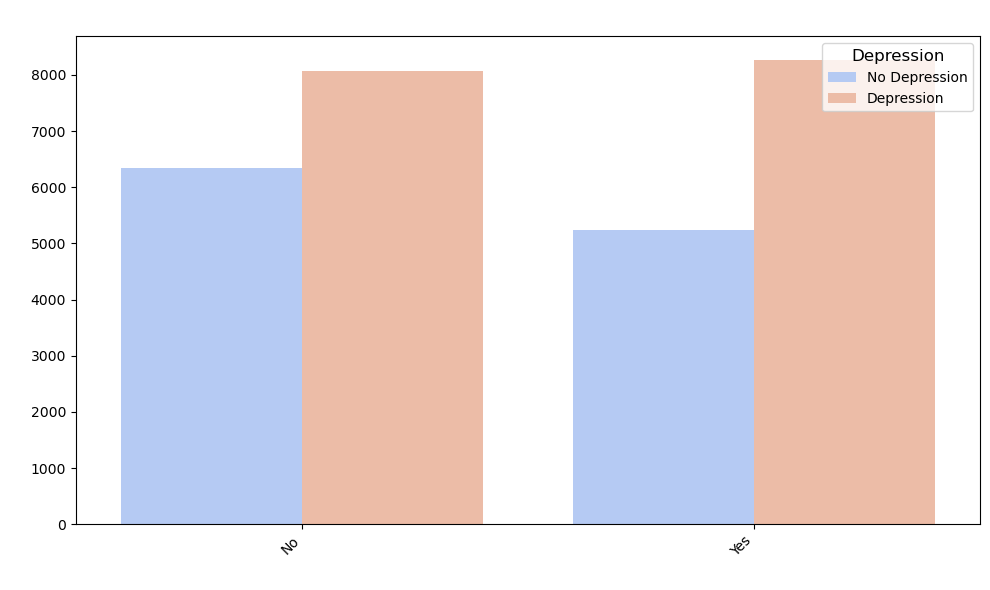

In [33]:
#For Family History of mental illness
plot_countplot(df, x_column='Family History of Mental Illness', hue_column='Depression', title='Family History of Mental Illness vs Depression')


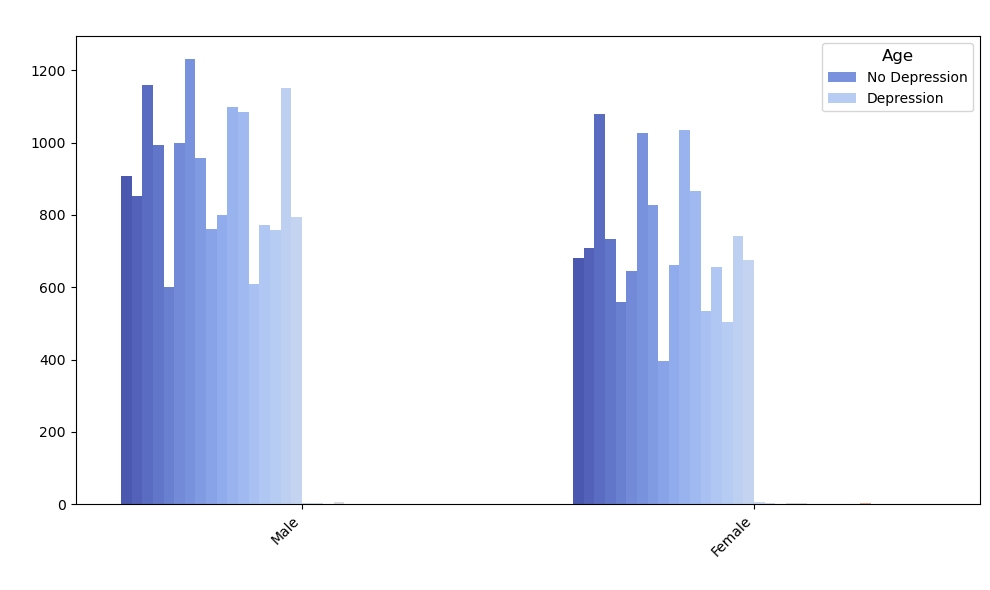

In [34]:
#Barplot for age and gender
plot_countplot(df, x_column='Gender', hue_column='Age', title='Gender vs Depression')


In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# Scatter plot for Age vs CGPA (Interactive Plotly)
def plot_scatter_age_cgpa(df):
    fig = px.scatter(
        df,
        x='Age',
        y='CGPA',
        color='Depression',  # Color by Depression status
        color_continuous_scale='Blues',  # Adjust color scale for better contrast
        title='Scatter Plot: Age vs CGPA',
        labels={'Age': 'Age', 'CGPA': 'CGPA'},
        template='plotly_dark',  # Use dark theme
        hover_data=['Gender', 'Work/Study Hours']  # Hover data for better insights
    )

    # Update layout for better contrast
    fig.update_layout(
        plot_bgcolor='#2a2a2a',  # Dark background
        paper_bgcolor='#2a2a2a',  # Dark background for the entire paper
        font=dict(color='white'),  # White text color for readability
        xaxis=dict(showgrid=True, gridcolor='gray'),
        yaxis=dict(showgrid=True, gridcolor='gray'),
    )

    fig.show()

# Scatter plot for Work/Study Hours vs Age 
def plot_scatter_work_study(df):
    fig = px.scatter(
        df,
        x='Work/Study Hours',
        y='Age',
        color='Depression',  # Color by Depression status
        color_continuous_scale='Viridis',  # Change the color scale for contrast
        title='Scatter Plot: Work/Study Hours vs Age',
        labels={'Work/Study Hours': 'Work/Study Hours', 'Age': 'Age'},
        template='plotly_dark',  # Dark theme
        hover_data=['Gender', 'CGPA']  # Hover data for additional info
    )

    # Update layout for better contrast
    fig.update_layout(
        plot_bgcolor='#2a2a2a',  # Dark background
        paper_bgcolor='#2a2a2a',  # Dark background for the entire paper
        font=dict(color='white'),  # White text color for readability
        xaxis=dict(showgrid=True, gridcolor='gray'),
        yaxis=dict(showgrid=True, gridcolor='gray'),
    )

    fig.show()

# Boxplot for Depression vs Age by Gender (Interactive Plotly)
def plot_boxplot_age_by_depression_gender(df):
    fig = px.box(
        df,
        x='Depression',
        y='Age',
        color='Gender',
        title='Box Plot: Age vs Depression by Gender',
        labels={'Age': 'Age', 'Depression': 'Depression Status'},
        template='plotly_dark',  # Dark theme
        color_discrete_sequence=['#1f77b4', '#ff7f0e'],  # Custom colors for gender
        points='all'  # Show all data points as dots
    )

    # Update layout for better contrast
    fig.update_layout(
        plot_bgcolor='#2a2a2a',  # Dark background
        paper_bgcolor='#2a2a2a',  # Dark background for the entire paper
        font=dict(color='white'),  # White text color for readability
    )

    fig.show()



In [36]:
# Usage Example:
plot_scatter_age_cgpa(df)



In [37]:
plot_scatter_work_study(df)

In [38]:

plot_boxplot_age_by_depression_gender(df)

In [39]:
def plot_violin(df):
    fig = px.violin(
        df, 
        x='Depression', 
        y='Age', 
        color='Gender',
        box=True,  # Add a box plot inside the violin plot for more insight
        points='all',  # Show all points
        title='Violin Plot: Age Distribution by Depression and Gender',
        labels={'Age': 'Age', 'Depression': 'Depression Status'},
        template='plotly_dark',
    )
    
    # Update layout for dark theme
    fig.update_layout(
        plot_bgcolor='#2a2a2a',
        paper_bgcolor='#2a2a2a',
        font=dict(color='white')
    )

    fig.show()

# Usage
plot_violin(df)


In [40]:
def plot_sunburst(df):
    fig = px.sunburst(
        df, 
        path=['Gender', 'Depression', 'Degree'],  # Hierarchical structure
        title='Sunburst Chart: Gender, Depression, and Degree Distribution',
        template='plotly_dark'
    )
    
    # Update layout for dark theme
    fig.update_layout(
        plot_bgcolor='#2a2a2a',
        paper_bgcolor='#2a2a2a',
        font=dict(color='white')
    )
    
    fig.show()

# Usage
plot_sunburst(df)


In [41]:
def plot_treemap(df):
    fig = px.treemap(
        df, 
        path=['Gender', 'Depression'],  # Hierarchical categories
        title='Treemap: Gender and Depression Distribution',
        template='plotly_dark'
    )
    
    # Update layout for dark theme
    fig.update_layout(
        plot_bgcolor='#2a2a2a',
        paper_bgcolor='#2a2a2a',
        font=dict(color='white')
    )
    
    fig.show()

# Usage
plot_treemap(df)


Model Building

In [42]:
# 1. **Data Preprocessing**
def preprocess_data(df):
    # Splitting the data into features and target variable
    X = df.drop(columns=['Depression', 'City', 'id'], axis=1)
    y = df['Depression']
    
    # Encoding the categorical variables using LabelEncoder
    le = LabelEncoder()
    for column in X.select_dtypes(include='object'):
        X[column] = le.fit_transform(X[column])
    
    # Scaling the features using StandardScaler
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled = pd.DataFrame(X_scaled, columns=X.columns)
    
    # Balancing the data using SMOTE
    smote = SMOTE(random_state=42)
    X_balanced, y_balanced = smote.fit_resample(X_scaled, y)
    
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)
    
    return X_train, X_test, y_train, y_test


In [43]:
# 2. **Model Building and Evaluation**
def evaluate_model(model, X_train, X_test, y_train, y_test):
    # Training the model
    model.fit(X_train, y_train)
    
    # Predictions
    y_pred = model.predict(X_test)
    
    # Accuracy Score
    accuracy = accuracy_score(y_test, y_pred)
    
    # Classification Report
    clf_report = classification_report(y_test, y_pred)
    
    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    
    return accuracy, clf_report, cm, y_pred


In [44]:
# 3. **Plotting Confusion Matrix**
def plot_confusion_matrix(cm, model_name):
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['No Depression', 'Depression'], yticklabels=['No Depression', 'Depression'])
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

In [100]:
# 4. **Plotting ROC Curve**
def plot_roc_curve(model, X_test, y_test, model_name):
    # Predict probabilities for ROC curve
    y_prob = model.predict_proba(X_test)[:, 1]
    
    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = roc_auc_score(y_test, y_prob)
    
    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.title(f'ROC Curve for {model_name}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.show()

In [109]:
# 5. **Cross-Validation Score with Boxplot**
def cross_val_plot(model, X, y,name):
    cv_scores = cross_val_score(model, X, y, cv=5)
    plt.figure(figsize=(8,6))
    sns.boxplot(data=cv_scores, color='skyblue')
    plt.title(f'Cross-Validation Scores (Logistic Regression vs Random Forest)--{name}')
    plt.xlabel('Model')
    plt.ylabel('Accuracy')
    plt.show()
    
    return cv_scores.mean()


In [107]:
# 6. **Comparing the Models**
def compare_models(X_train, X_test, y_train, y_test):
    # Logistic Regression Model
    lg = LogisticRegression(max_iter=1000)
    lg_accuracy, lg_report, lg_cm, lg_pred = evaluate_model(lg, X_train, X_test, y_train, y_test)
    
    # Random Forest Model
    rf = RandomForestClassifier(random_state=42)
    rf_accuracy, rf_report, rf_cm, rf_pred = evaluate_model(rf, X_train, X_test, y_train, y_test)
    
    # Print results for both models
    print("Logistic Regression - Accuracy: ", lg_accuracy)
    print(lg_report)
    plot_confusion_matrix(lg_cm, 'Logistic Regression')
    plot_roc_curve(lg, X_test, y_test, 'Logistic Regression')

    print("\nRandom Forest - Accuracy: ", rf_accuracy)
    print(rf_report)
    plot_confusion_matrix(rf_cm, 'Random Forest')
    plot_roc_curve(rf, X_test, y_test, 'Random Forest')

    # Comparing Cross-Validation Scores
    lg_cv_score = cross_val_plot(lg, X_train, y_train,name="Logistic Regression")  # Corrected reference
    rf_cv_score = cross_val_plot(rf, X_train, y_train,name="Random Forest ")  # Corrected reference
    
    print("\nCross-Validation Scores:")
    print(f'Logistic Regression: {lg_cv_score}')
    print(f'Random Forest: {rf_cv_score}')

    return lg_accuracy, rf_accuracy


Logistic Regression - Accuracy:  0.8407039020657996
              precision    recall  f1-score   support

           0       0.85      0.83      0.84      3281
           1       0.83      0.85      0.84      3254

    accuracy                           0.84      6535
   macro avg       0.84      0.84      0.84      6535
weighted avg       0.84      0.84      0.84      6535



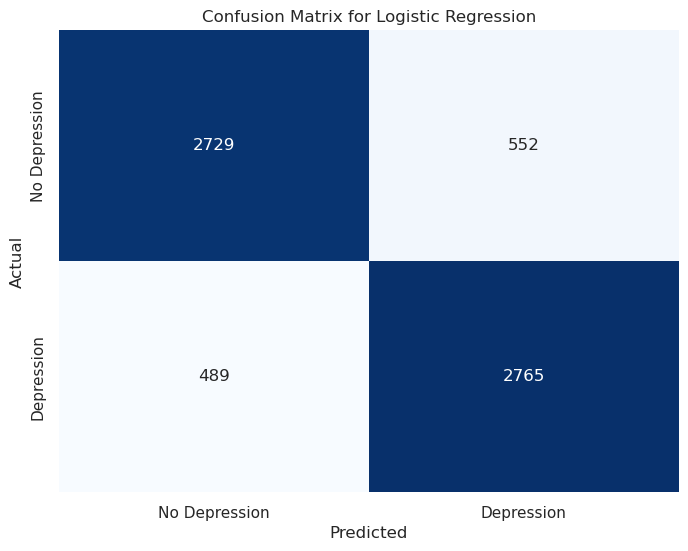

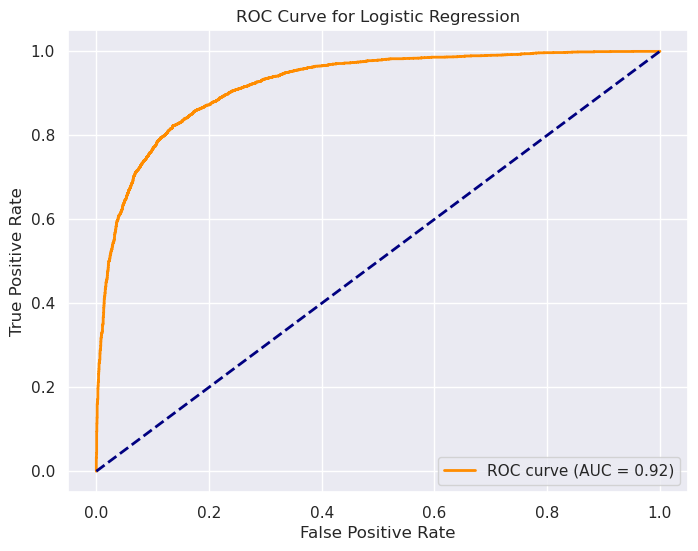


Random Forest - Accuracy:  0.8607498087222647
              precision    recall  f1-score   support

           0       0.87      0.85      0.86      3281
           1       0.85      0.87      0.86      3254

    accuracy                           0.86      6535
   macro avg       0.86      0.86      0.86      6535
weighted avg       0.86      0.86      0.86      6535



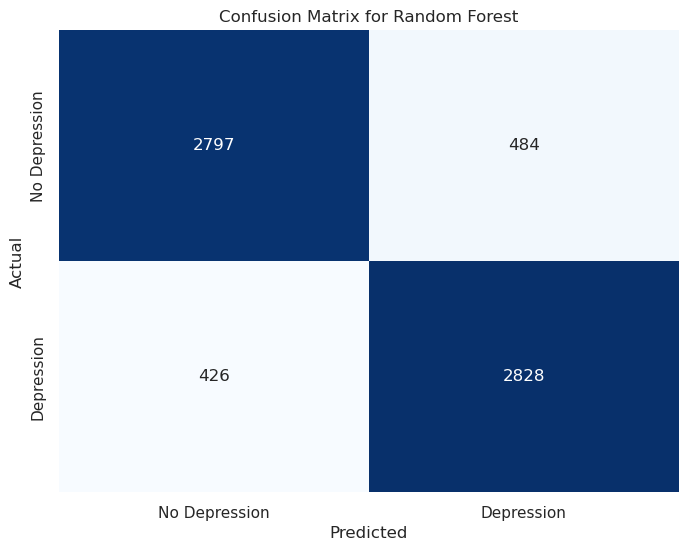

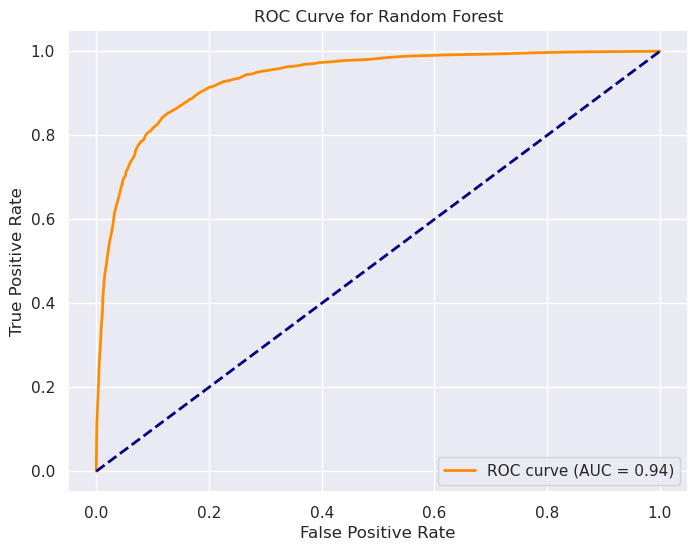

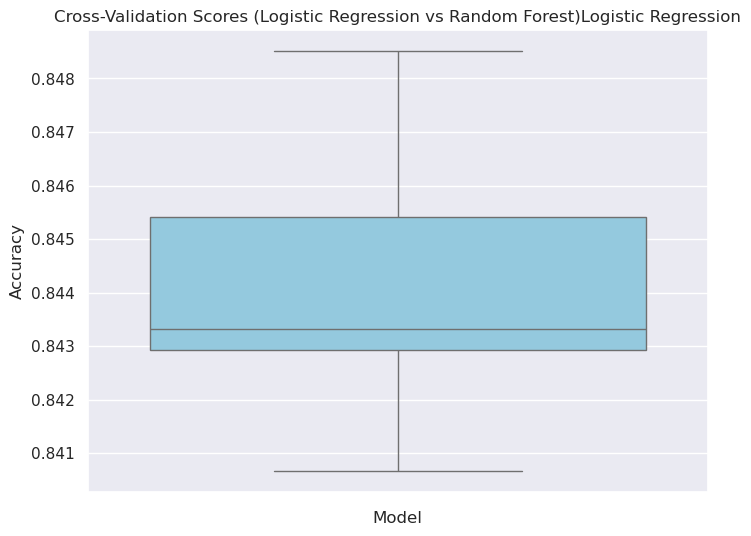

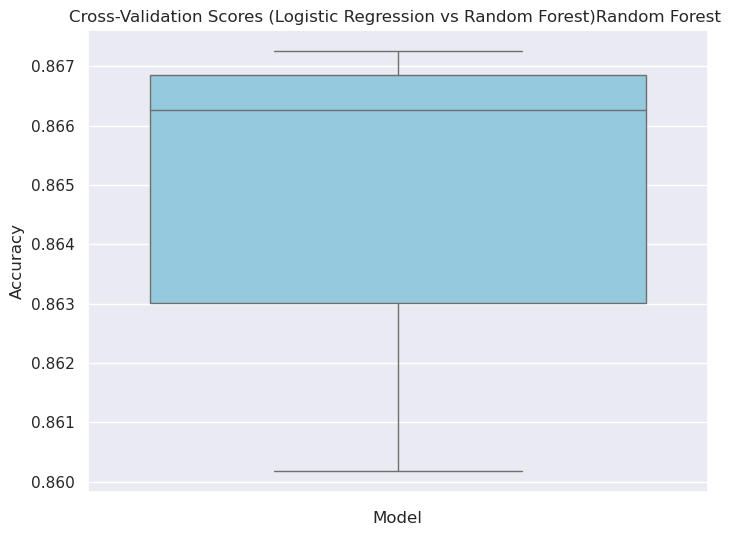


Cross-Validation Scores:
Logistic Regression: 0.8441672403412976
Random Forest: 0.8647129355566392


(0.8407039020657996, 0.8607498087222647)

In [108]:
# 7. **Execution**
X_train, X_test, y_train, y_test = preprocess_data(df)
compare_models(X_train, X_test, y_train, y_test)



In [115]:
from sklearn.model_selection import GridSearchCV
rf=RandomForestClassifier()
lg=LogisticRegression()
# Hyperparameter tuning for Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
}

grid_search_rf = GridSearchCV(estimator=rf, param_grid=rf_param_grid, cv=5, scoring='accuracy')
grid_search_rf.fit(X_train, y_train)

print("Best parameters for Random Forest:", grid_search_rf.best_params_)
print("Best score for Random Forest:", grid_search_rf.best_score_)

# Hyperparameter tuning for Logistic Regression
lg_param_grid = {
    'C': [0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

grid_search_lg = GridSearchCV(estimator=lg, param_grid=lg_param_grid, cv=5, scoring='accuracy')
grid_search_lg.fit(X_train, y_train)

print("Best parameters for Logistic Regression:", grid_search_lg.best_params_)
print("Best score for Logistic Regression:", grid_search_lg.best_score_)


Best parameters for Random Forest: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 150}
Best score for Random Forest: 0.866434640101445
Best parameters for Logistic Regression: {'C': 1, 'solver': 'liblinear'}
Best score for Logistic Regression: 0.8441289921130778


In [121]:
# Fit the model with best params
rf = RandomForestClassifier(n_estimators=150, max_depth=20, min_samples_split=2)
rf.fit(X_train, y_train)

# Save the model to a pickle file
with open('/home/varun/Desktop/Mental Health Project/models/student_depressionrandom_forest_model.pkl', 'wb') as model_file:
    pickle.dump(rf, model_file)


In [122]:
# Fit the model with best params
lg = LogisticRegression(C=1,solver='liblinear')
lg.fit(X_train, y_train)

# Save the model to a pickle file
with open('/home/varun/Desktop/Mental Health Project/models/student_depressionrandom_logistic_regression.pkl', 'wb') as model_file:
    pickle.dump(rf, model_file)